# Yeast +1 library

# Before (HS) VS After (HS+Chd1)

In [2]:
# default modules
import sys
import math
import random
import pickle

In [3]:
# external modules
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.ticker as tck

In [4]:
# increase figure resolution
plt.rcParams['figure.dpi'] = 100

In [5]:
# custom modules
import analysis_final as analysis
from SliderClass_final import Slider
import graph_final as graph

In [6]:
# working directory
#path = "/home/spark159/../../media/spark159/sw/slide_seq_data(2021.07.14)/"
path = "./"

In [7]:
# basic parameters
tlen = 225 # sliding DNA template length
NCPlen = 147 # nucleosomal DNA length

In [8]:
# load +1 library data
HS_sliders = pickle.load(open(path+'Plusone_HS_corrected'+'.pickle'))
Chd1_sliders = pickle.load(open(path+'Plusone_HS+Chd1_corrected'+'.pickle'))

In [9]:
# set target ids
target_ids = list(set(HS_sliders.keys()) & set(Chd1_sliders.keys()))

In [13]:
# get KL-div between before and after
id_KL = {}
KL_id = []
for id in target_ids:
    psig1 = HS_sliders[id].get_psig()
    psig2 = Chd1_sliders[id].get_psig()
    KL = analysis.KL_div(psig1, psig2)
    id_KL[id] = KL
    KL_id.append((KL,id))
KL_id = sorted(KL_id)

id_order = {}
order_id = []
for i in range(len(KL_id)):
    KL, id = KL_id[i]
    id_order[id] = i
    order_id.append(id)

In [14]:
# group by equal partition                                                                                                                                                                                     
gnum = 4
gsize = int(math.ceil(float(len(target_ids))/gnum))
group_ids = []
for i in range(gnum):
    st = i*gsize
    ed = min((i+1)*gsize, len(target_ids))
    ids = [id for KL, id in KL_id[st:ed]]
    group_ids.append(ids)
assert len(target_ids) == sum([len(ids) for ids in group_ids])

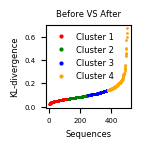

In [37]:
# plot KL over sequences
color_list = ['r', 'g', 'b', 'orange']
fig = plt.figure(figsize=(1.1, 1.1))
for i in range(len(group_ids)):
    X = [id_order[id] + 1 for id in group_ids[i]]
    Y = [id_KL[key] for key in group_ids[i]]
    plt.plot(X, Y, '.', markersize=2, label='Cluster ' + str(i+1), color=color_list[i])
plt.xlabel("Sequences", fontsize=6)
plt.ylabel("KL-divergence", fontsize=6)
plt.title("Before VS After", fontsize=6)
plt.gca().tick_params(axis='both', which='major', labelsize=5)
plt.gca().tick_params(axis='both', which='minor', labelsize=5)
leg = plt.legend(frameon=False, fontsize=6, markerscale=2)
plt.savefig("group_byKL.svg", format='svg', bbox_inches='tight')
plt.show()
plt.close()

In [22]:
# Sample top 10 sequences for each cluster
snum = 10
sample_ids = []
for ids in group_ids:
    sample_ids += ids[:snum]

In [23]:
# plot dyadmap for sample (HS)
note = 'Before'
graph.plot_map(HS_sliders, Slider.KDE, ids=sample_ids, 
               mark=None, cmap='YlGnBu', thickness=[8,2,2], 
               xticks=[[i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)]], 
               figscale=150, fontsize=5, save=True, note=note, scale=100, band_width=1)

/usr/local/lib/python2.7/dist-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  2.6761489e-316,
  5.170747658978888e-300,
  3.6753773403843484e-284,
  9.610722575738108e-269,
  9.245186292222827e-254,
  3.2717552687123536e-239,
  4.259429871743188e-225,
  2.0399881856352395e-211,
  3.594258846326068e-198,
  2.3296815831321333e-185,
  5.555066991586108e-173,
  4.8729006060449175e-161,
  1.572502423634459e-149,
  1.8668121208454734e-138,
  8.15296200953415e-128,
  1.3098927649475577e-117,
  7.742150087417121e-108,
  1.6834218007798465e-98,
  1.3465727640535355e-89,
  3.9625268977582086e-81,
  4.289633007767747e-73,
  1.7083370967907695e-65,
  2.502836749515457e-58,
  1.348953541524878e-51,
  2.6746501305402622e-45,
  1.9509335888313583e-39,
  5.235082254094381e-34,
  5.167851810176694e-29,
  1.876731362325821e-24,
  2.507261833333

In [24]:
# plot dyadmap for sample (Chd1)
note = 'After'
graph.plot_map(Chd1_sliders, Slider.KDE, ids=sample_ids, 
               mark=None, cmap='YlGnBu', thickness=[8,2,2], 
               xticks=[[i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)]], 
               figscale=150, fontsize=5, save=True, note=note, scale=100, band_width=1)

[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  2.28587717e-316,
  4.416680292044543e-300,
  3.139384811578351e-284,
  8.209158866776442e-269,
  7.896929957940466e-254,
  2.7946242920251825e-239,
  3.638263015447368e-225,
  1.7424899085634636e-211,
  3.070096097903744e-198,
  1.9899363522590707e-185,
  4.7449530553151016e-173,
  4.16226926766817e-161,
  1.3431791535253226e-149,
  1.5945686865689506e-138,
  6.963988383303402e-128,
  1.1188667367957001e-117,
  6.613086534120947e-108,
  1.4379227888273911e-98,
  1.150197570733643e-89,
  3.384658403337081e-81,
  3.664061561314841e-73,
  1.4592046401493695e-65,
  2.137839869464913e-58,
  1.1522313638364786e-51,
  2.2845981387345017e-45,
  1.666424725058244e-39,
  4.471649422952843e-34,
  4.414251471020177e-29,
  1.6030855145

In [25]:
# get mean psig
def get_mean_psig (id_slider, ids):
    psigs = []
    for id in ids:
        psig = id_slider[id].get_psig()
        psigs.append(psig)
    mean_psig = np.asarray(psigs).mean(axis=0)
    return mean_psig

In [30]:
# plot psigs
def plot_sigs (sigs,
               colors,
               alphas,
               labels,
               note=''):
    fig = plt.figure(figsize=(2, 1))
    for sig, color, alpha, label in zip(sigs, colors, alphas, labels):
        plt.plot(sig, color, alpha=alpha, label=label, lw=0.8)
    ax = plt.gca()
    plt.xticks([i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)])
    ax.tick_params(axis='x', labelsize=5)
    ax.tick_params(axis='y', labelsize=5)
    ax.xaxis.set_minor_locator(tck.AutoMinorLocator(2))
    #plt.legend()
    plt.savefig('p_sigs' + '_' + note + '.svg', format='svg', bbox_inches='tight')
    plt.show()
    plt.close

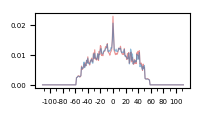

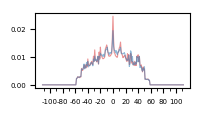

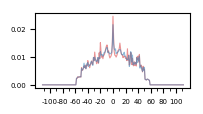

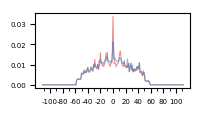

In [31]:
# plot mean psig for each group
for i in range(len(group_ids)):
    ids = group_ids[i]
    mean_psig1 = get_mean_psig(HS_sliders, ids=ids)
    mean_psig2 = get_mean_psig(Chd1_sliders, ids=ids)
    plot_sigs([mean_psig1, mean_psig2], 
              colors=['tab:red', 'tab:blue'], 
              alphas=[0.5, 0.5], 
              labels=['Before', 'After'],
              note='_' + str(i))

In [32]:
# get mean psig for each group
mean_psigs1, mean_psigs2 = [], []
for i in range(len(group_ids)):
    ids = group_ids[i]
    mean_psig1 = get_mean_psig(HS_sliders, ids=ids)
    mean_psigs1.append(mean_psig1)
    mean_psig2 = get_mean_psig(Chd1_sliders, ids=ids)
    mean_psigs2.append(mean_psig2)

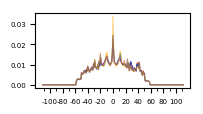

In [33]:
# get mean psig for each group (HS)
color_list = ['r', 'g', 'b', 'orange']
plot_sigs(mean_psigs1, 
          colors=color_list,
          alphas=[0.5]*len(mean_psigs1), 
          labels=[str(i+1) for i in range(len(mean_psigs1))],
          note='_HS')

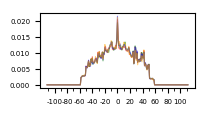

In [34]:
# get mean psig for each group (Chd1)
color_list = ['r', 'g', 'b', 'orange']
plot_sigs(mean_psigs2, 
          colors=color_list,
          alphas=[0.5]*len(mean_psigs2), 
          labels=[str(i+1) for i in range(len(mean_psigs2))],
          note='_HS')

In [ ]:

# get averaged psig for all sequences
psigs1, psigs2, psigs3 = [], [], []
for id in common_ids:
    psig1 = SD_sliders[id].get_psig()
    psig2 = HS_sliders[id].get_psig()
    psig3 = Chd1_sliders[id].get_psig()
    psigs1.append(psig1)
    psigs2.append(psig2)
    psigs3.append(psig3)
mean_psig1 = np.asarray(psigs1).mean(axis=0)
mean_psig2 = np.asarray(psigs2).mean(axis=0)
mean_psig3 = np.asarray(psigs3).mean(axis=0)

In [9]:
# get nucleosome positioning signal
id_psig1, id_psig2, id_psig3 = {}, {}, {}
for id in target_ids:
    psig1 = SD_sliders[id].get_psig()
    psig2 = HS_sliders[id].get_psig()
    psig3 = Chd1_sliders[id].get_psig()
    id_psig1[id] = psig1
    id_psig2[id] = psig2
    id_psig3[id] = psig3

In [10]:
# check NMF approximation error by increasing the dimension
cnum_list = range(1, 21)
error_list1, error_list2, error_list3 = [], [], []
for cnum in cnum_list:
    _, _, error1 = analysis.NMF_analysis(id_psig1, cnum=cnum)
    _, _, error2 = analysis.NMF_analysis(id_psig2, cnum=cnum)
    _, _, error3 = analysis.NMF_analysis(id_psig3, cnum=cnum)
    error_list1.append(error1)
    error_list2.append(error2)
    error_list3.append(error3)

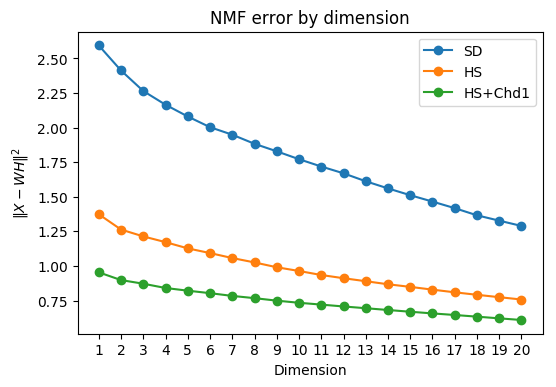

In [11]:
# plot NMF error by dimension
fig = plt.figure()
plt.plot(cnum_list, error_list1, 'o-', label='SD')
plt.plot(cnum_list, error_list2, 'o-', label='HS')
plt.plot(cnum_list, error_list3, 'o-', label='HS+Chd1')
plt.title("NMF error by dimension")
plt.xlabel("Dimension")
plt.ylabel("${\Vert X-WH \Vert}^{2} $")
plt.xticks(cnum_list, [str(cnum) for cnum in cnum_list])
plt.legend()
plt.show()
plt.close()

In [12]:
# NMF analysis
cID_basis1, id_weight1, error1 = analysis.NMF_analysis(id_psig1, cnum=4)
cID_basis2, id_weight2, error2 = analysis.NMF_analysis(id_psig2, cnum=2)
cID_basis3, id_weight3, error3 = analysis.NMF_analysis(id_psig3, cnum=2)

In [34]:
# set the name of basis
# SD
cID_bname1 = ['noisy', 'left-bound', 'right-bound', 'dyad-zero']
# HS
cID_bname2 = ['dyad-zero', 'noisy']
# HS+Chd1
cID_bname3 = ['dyad-zero', 'noisy']

In [14]:
def get_mean_cutmaps (id_slider, id_weight, comp, fract=0.1):
    ids = analysis.dict_sort({id:id_weight[id][comp] for id in target_ids}, reverse=True)
    ids = ids[:int(fract*len(target_ids))]
    print len(ids)
    top_cutmaps, bott_cutmaps = [], []
    for id in ids:
        top_cutmap, bott_cutmap = id_slider[id].get_cutsig()
        top_cutmaps.append(top_cutmap)
        bott_cutmaps.append(bott_cutmap)
    return np.mean(top_cutmaps, axis=0), np.mean(bott_cutmaps, axis=0)

In [15]:
def plot_basis (cID_basis, cID_bname=None, note=''):
    for cID in range(len(cID_basis)):
        if cID_bname != None:
            print "basis %d (%s)" % (cID+1, cID_bname[cID])
        else:
            print "basis %d" % (cID+1)
        basis = cID_basis[cID]
        #fig = plt.figure(figsize=(1.8, 1.2))
        fig = plt.figure(figsize=(1.3, 0.9))
        plt.plot(basis, 'b', lw=0.8)
        ax = plt.gca()
        plt.xticks([i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)])
        ax.tick_params(axis='x', labelsize=5)
        ax.tick_params(axis='y', labelsize=5)
        ax.xaxis.set_minor_locator(tck.AutoMinorLocator(2))
        plt.xlim([30, tlen-30])
        plt.savefig('NMF_basis_' + str(cID) + '_' + note + '.svg', format='svg', bbox_inches='tight')
        plt.show()
        plt.close

SD data
basis 1 (left-bound)


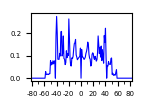

basis 2 (right-bound)


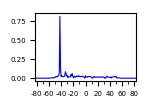

basis 3 (noisy)


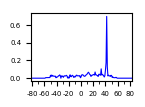

basis 4 (dyad-zero)


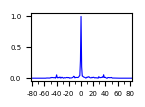

In [16]:
print 'SD data'
plot_basis(cID_basis1, cID_bname=cID_bname1, note='SD')

HS data
basis 1 (dyad-zero)


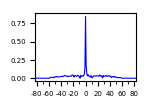

basis 2 (noisy)


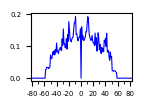

In [17]:
print 'HS data'
plot_basis(cID_basis2, cID_bname=cID_bname2, note='HS')

HS+Chd1 data
basis 1 (dyad-zero)


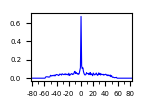

basis 2 (noisy)


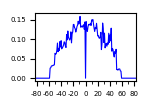

In [18]:
print 'HS+Chd1 data'
plot_basis(cID_basis3, cID_bname=cID_bname3, note='HS+Chd1')

In [19]:
# clustering based on the weight
def NMF_clustering (id_weight):
    # simple clustering
    id_cID = {}
    cID_value_ids = {}
    for id, weight in id_weight.items():
        cID = np.argmax(np.asarray(weight))
        value = weight[cID]
        id_cID[id] = cID
        if cID not in cID_value_ids:
            cID_value_ids[cID] = []
        cID_value_ids[cID].append((value, id))
    # sorted by weight value
    cID_ids = []
    for cID in sorted(cID_value_ids):
        value_ids = sorted(cID_value_ids[cID], reverse=True)
        ids = [id for value, id, in value_ids]
        cID_ids.append(ids)
    return id_cID, cID_ids

In [20]:
id_cID1, cID_ids1 = NMF_clustering (id_weight1)
id_cID2, cID_ids2 = NMF_clustering (id_weight2)
id_cID3, cID_ids3 = NMF_clustering (id_weight3)

In [21]:
# plot dyadmap (SD)
snum=15
note='_NMF_SD'
ids = []
for cID in range(len(cID_ids1)):
    ids += cID_ids1[cID][:snum]

graph.plot_map(SD_sliders, Slider.KDE, ids=ids, 
               mark=None, cmap='YlGnBu', thickness=[8,2,2], 
               xticks=[[i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)]], 
               figscale=150, fontsize=5, save=True, note=note, scale=100, band_width=1)

/usr/local/lib/python2.7/dist-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  2.5516769e-316,
  4.9302477678634594e-300,
  3.5044295571105636e-284,
  9.163712223377953e-269,
  8.815177627468042e-254,
  3.1195806050512303e-239,
  4.061316854452699e-225,
  1.9451050142104035e-211,
  3.427084016265274e-198,
  2.2213243001973376e-185,
  5.296691782683716e-173,
  4.646254066250144e-161,
  1.4993627760423494e-149,
  1.7799836501684272e-138,
  7.773754474919537e-128,
  1.2489675203772742e-117,
  7.382050088347228e-108,
  1.605123115324215e-98,
  1.2839414791227257e-89,
  3.778223372475992e-81,
  4.090115344581973e-73,
  1.6288797210097183e-65,
  2.3864263894619517e-58,
  1.2862124709079592e-51,
  2.5502529437332823e-45,
  1.8602026926675883e-39,
  4.991664463929153e-34,
  4.927686273305613e-29,
  1.7896386309843586e-24,
  2.3913607804884737

noisy


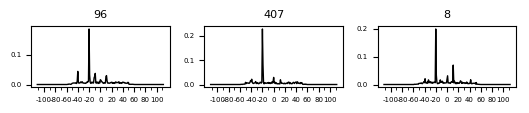

left-bound


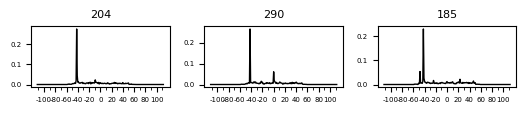

right-bound


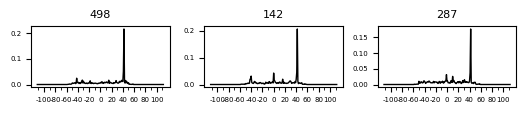

dyad-zero


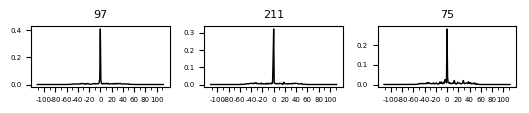

In [36]:
# plot cleavages and dyad signals (SD)
snum=3
note='_NMF_SD'
for cID in range(len(cID_ids1)):
    print cID_bname1[cID]
    ids = cID_ids1[cID][:snum]
    graph.plot_sig(SD_sliders, [Slider.get_psig], ids=ids, color=['black'], alpha=[1], 
                   xticks=[[i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)]],
                   save=False, note=note)

In [23]:
# plot dyadmap (HS)
snum=20
note='_NMF_HS'
ids = []
for cID in range(len(cID_ids2)):
    ids += cID_ids2[cID][:snum]

graph.plot_map(HS_sliders, Slider.KDE, ids=ids, 
               mark=None, cmap='YlGnBu', thickness=[8,2,2], 
               xticks=[[i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)]], 
               figscale=150, fontsize=5, save=True, note=note, scale=100, band_width=1)

[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  2.88742383e-316,
  5.578964579424182e-300,
  3.9655387093617696e-284,
  1.0369463831716675e-268,
  9.975069420555478e-254,
  3.5300517372946493e-239,
  4.5957006510909977e-225,
  2.2010398845012687e-211,
  3.878016123667758e-198,
  2.5136038133795086e-185,
  5.993624911974727e-173,
  5.2576032854697294e-161,
  1.6966473518161952e-149,
  2.014192025122829e-138,
  8.796616905024045e-128,
  1.413305351654001e-117,
  8.353372462739388e-108,
  1.8163235218940152e-98,
  1.4528811401630012e-89,
  4.275357968633786e-81,
  4.6282882452230197e-73,
  1.8432058149584318e-65,
  2.7004291244771594e-58,
  1.455449873750523e-51,
  2.885806719793435e-45,
  2.10495

dyad-zero


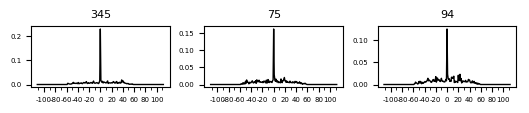

noisy


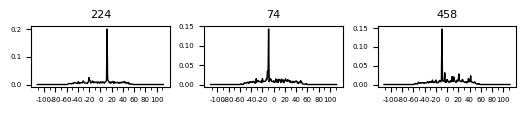

In [37]:
# plot cleavages and dyad signals (HS)
snum=3
note='_NMF_HS'
for cID in range(len(cID_ids2)):
    print cID_bname2[cID]
    ids = cID_ids2[cID][:snum]
    graph.plot_sig(HS_sliders, [Slider.get_psig], ids=ids, color=['black'], alpha=[1], 
                   xticks=[[i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)]],
                   save=False, note=note)

In [24]:
# plot dyadmap (HS+Chd1)
snum=20
note='_NMF_HS+Chd1'
ids = []
for cID in range(len(cID_ids3)):
    ids += cID_ids3[cID][:snum]

graph.plot_map(Chd1_sliders, Slider.KDE, ids=ids, 
               mark=None, cmap='YlGnBu', thickness=[8,2,2], 
               xticks=[[i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)]], 
               figscale=150, fontsize=5, save=True, note=note, scale=100, band_width=1)

[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  2.7430526e-316,
  5.30001635045321e-300,
  3.767261773893849e-284,
  9.850990640131282e-269,
  9.47631594952813e-254,
  3.3535491504300666e-239,
  4.3659156185366436e-225,
  2.09098789027618e-211,
  3.684115317484325e-198,
  2.3879236227105047e-185,
  5.693943666375922e-173,
  4.994723121196182e-161,
  1.6118149842253663e-149,
  1.9134824238666646e-138,
  8.356786059772741e-128,
  1.3426400840712848e-117,
  7.93570383960255e-108,
  1.7255073457993426e-98,
  1.3802370831548738e-89,
  4.0615900702021634e-81,
  4.396873832961941e-73,
  1.7510455242105385e-65,
  2.5654076682533433e-58,
  1.382677380063e-51,
  2.7415163838037684e-45,
  1.9997069285521425e-39,
  5.36595931044674e-34,
  5.297048105431113e-29,
  1.92

dyad-zero


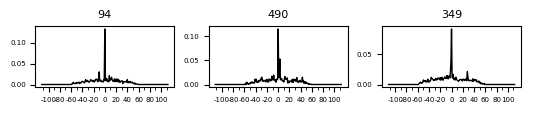

noisy


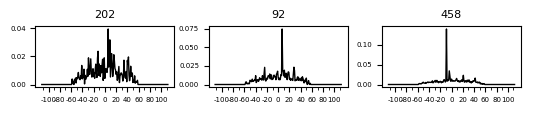

In [38]:
# plot cleavages and dyad signals (HS)
snum=3
note='_NMF_Chd1'
for cID in range(len(cID_ids3)):
    print cID_bname3[cID]
    ids = cID_ids3[cID][:snum]
    graph.plot_sig(Chd1_sliders, [Slider.get_psig], ids=ids, color=['black'], alpha=[1], 
                   xticks=[[i+tlen/2 for i in range(-100, 101, 20)], [str(i) for i in range(-100, 101, 20)]],
                   save=False, note=note)